In [1]:
import matplotlib.pyplot as mp
import pandas as pd
import seaborn as sb
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
import statsmodels.api as sm
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
import matplotlib.pyplot as plt
import statsmodels.tools.eval_measures as em
import os
from easy_mpl import regplot, plot
import numpy as np
from sklearn.impute import KNNImputer
import seaborn as sns

In [2]:
file_path = 'ML_photocatalysis2.xlsx'

# Read the Excel file
data = pd.read_excel(file_path, header=0)

# Assuming 'df' is your pandas DataFrame.
df = data.sample(frac=1, random_state=38).reset_index(drop=True)

# print(df)

In [5]:
# Separate the features and the target variable
X = df.drop('SA removal rate', axis=1)
y = df['SA removal rate']

# Split the data into training, validation, and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.125, random_state=42)

# Normalize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
# X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

<Axes: >

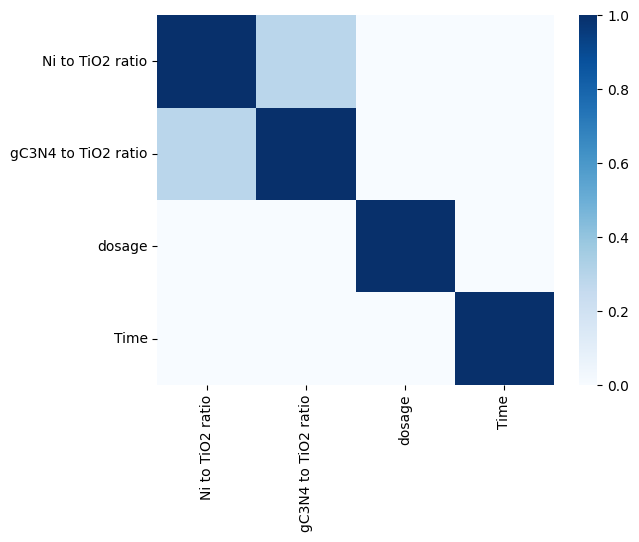

In [6]:
sns.heatmap(X.corr(), cmap='Blues')

### SVR

In [7]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error

# Scaling the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the parameter grid to search
param_grid = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'degree': [2, 3, 4, 5],
    'gamma': ['scale', 'auto'],
    'C': [0.1, 1, 10, 100],
    'epsilon': [0.01, 0.1, 0.5, 1],
    'shrinking': [True, False]
}

# Initialize the SVR model
svr = SVR()

# Initialize the Grid Search model
grid_search = GridSearchCV(svr, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs = -1)

# Fit the model
grid_search.fit(X_train_scaled, y_train)

# Best model
best_model_svr = grid_search.best_estimator_

# Predictions
y_pred = best_model_svr.predict(X_test_scaled)

# Evaluate the model
n = X_test_scaled.shape[0]  # Number of observations
p = X_test_scaled.shape[1]  # Number of predictors

test_mse = mean_squared_error(y_test, y_pred)
test_mae = mean_absolute_error(y_test, y_pred)
print(test_mae)
test_r2 = r2_score(y_test, y_pred)
test_adjusted_r_squared = 1 - (1 - test_r2) * (n - 1) / (n - p - 1)

print(f'Best model parameters: {grid_search.best_params_}')
print(f'MSE_test: {test_mse}, R2_test: {test_r2}, Adjust_R2_test: {test_adjusted_r_squared}')


Fitting 5 folds for each of 1024 candidates, totalling 5120 fits
0.016349119899123278
Best model parameters: {'C': 10, 'degree': 2, 'epsilon': 0.01, 'gamma': 'scale', 'kernel': 'rbf', 'shrinking': False}
MSE_test: 0.0017141014505492754, R2_test: 0.969933500263586, Adjust_R2_test: 0.9653078849195224


In [8]:
n = X_train_scaled.shape[0]  # Number of observations
p = X_train_scaled.shape[1]  # Number of predictors
y_train_pred_svr = best_model_svr.predict(X_train_scaled)
train_mse_svr = mean_squared_error(y_train, y_train_pred_svr)
train_r2_svr = r2_score(y_train, y_train_pred_svr)
train_adjusted_r_squared_svr = 1 - (1 - train_r2_svr) * (n - 1) / (n - p - 1)
print(f'MSE_train: {train_mse_svr}, R2_train: {train_r2_svr}, Adjust_R2_train: {train_adjusted_r_squared_svr}')

MSE_train: 0.001665224698164343, R2_train: 0.9667104898811161, Adjust_R2_train: 0.9655723869710687


In [9]:
n = len(y_test)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(test_mse, n)
llf_svr = log_likelihood
nobs = n
df_modelwc = len(X_test.columns)
bic_value_svr = em.bic(llf_svr, nobs, df_modelwc)
print(bic_value_svr)

-95.72471653076191


In [10]:
n = len(y_train)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood_svr = calculate_log_likelihood_from_mse(train_mse_svr, n)
llf = log_likelihood_svr
nobs = n
df_modelwc_svr = len(X_test.columns)
bic_value_svr = em.bic(llf, nobs, df_modelwc_svr)
print(bic_value_svr)

-415.093929437059


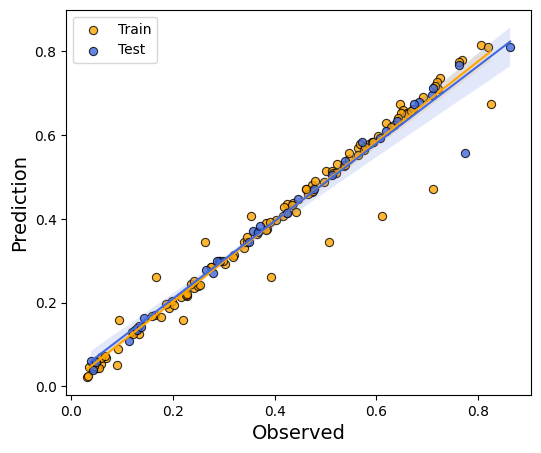

In [11]:
ax = regplot(y_train, y_train_pred_svr, line_color='orange',
             marker_color='orange', marker_size=35, fill_color='orange',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Train")
_ = regplot(y_test, y_pred, line_color='royalblue', ax=ax,
                marker_color='royalblue', marker_size=35, fill_color='royalblue',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Test", ax_kws=dict(legend_kws=dict(loc=(0.1, 0.8))))
plt.show()

0.016349119899123278
Mean absolute error for SVR: 0.016349119899123278


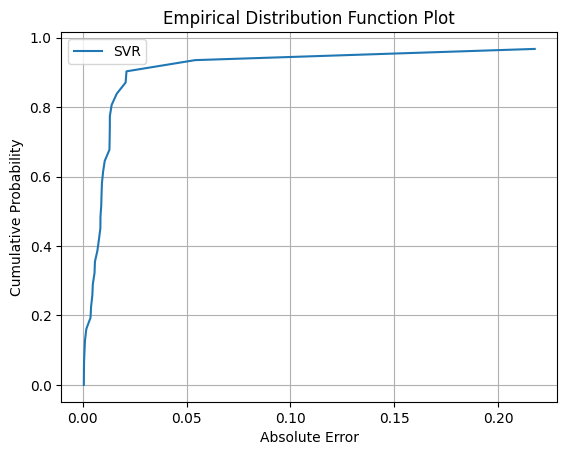

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error

# Assuming you have your test data `X_test` and true target values `y_test`
# X_test = ... # Your test features
# y_test = ... # True target values

# print(np.abs())

# List of your models
models = [best_model_svr]

# Calculate individual absolute errors for each model
absolute_errors = []
for model in models:
    y_pred = model.predict(X_test_scaled)
    
    errors = np.abs(y_test-y_pred)  # This will give us an array of errors
    absolute_errors.append(errors)
    print(np.mean(errors))
    # Print the mean absolute error for the current model
    print(f'Mean absolute error for {model.__class__.__name__}: {mean_absolute_error(y_test, y_pred)}')

# Now, plot the ECDF for each set of errors
for errors, model in zip(absolute_errors, models):
    # Sort the individual absolute error data
    sorted_data = np.sort(errors)
    # Calculate the cumulative probability
    yvals = np.arange(len(sorted_data)) / float(len(sorted_data))
    plt.plot(sorted_data, yvals, label=model.__class__.__name__)

plt.xlabel('Absolute Error')
plt.ylabel('Cumulative Probability')
plt.title('Empirical Distribution Function Plot')
plt.legend(loc='best')
plt.grid(True)
plt.show()


### GradientBoostingRegressor

In [13]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler


# Scaling the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the parameter grid to search
param_grid = {
    'learning_rate': [0.01, 0.05, 0.1, 0.15, 0.2],
    'n_estimators': [1000],
    'subsample': [0.50],
    'min_samples_split': [20],
    'min_samples_leaf': [2],
    'max_depth': [3, 5],
    'alpha': [0.1]
}

# Initialize the GradientBoostingRegressor model
reg = GradientBoostingRegressor(random_state=0)

# Initialize the Grid Search model
grid_search = GridSearchCV(reg, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)

# Fit the model
grid_search.fit(X_train_scaled, y_train)

# Best model
best_model_GBR = grid_search.best_estimator_

# Predictions
y_pred = best_model_GBR.predict(X_test_scaled)

# Evaluate the model
n = X_test_scaled.shape[0]  # Number of observations
p = X_test_scaled.shape[1]  # Number of predictors

test_mse = mean_squared_error(y_test, y_pred)
test_r2 = r2_score(y_test, y_pred)
test_adjusted_r_squared = 1 - (1 - test_r2) * (n - 1) / (n - p - 1)

print(f'Best model parameters: {grid_search.best_params_}')
print(f'MSE_test: {test_mse}, R2_test: {test_r2}, Adjust_R2_test: {test_adjusted_r_squared}')


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best model parameters: {'alpha': 0.1, 'learning_rate': 0.01, 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 20, 'n_estimators': 1000, 'subsample': 0.5}
MSE_test: 0.0012829332104856855, R2_test: 0.9774964830567386, Adjust_R2_test: 0.9740344035270061


In [14]:
import numpy as np
import pandas as pd
from itertools import product

# Define the columns as numpy arrays
column1 = np.arange(0, 10.1, 0.1)
column2 = np.arange(0, 2.6, 0.1)
column3 = np.arange(0, 1.6, 0.1)
column4 = np.arange(3, 5.1, 0.1)

# Create all combinations of the four columns
all_combinations = list(product(column1, column2, column3, column4))

# Convert to a pandas DataFrame
df = pd.DataFrame(all_combinations, columns=['Column 1', 'Column 2', 'Column 3', 'Column 4'])

df_y = best_model_GBR.predict(df)
df_y = pd.DataFrame(df_y)

# Define the path for the Excel file
excel_filename = 'df_y.xlsx'

# Save the DataFrame to an Excel file
df_y.to_excel(excel_filename, index=False)
# Assuming df is your primary DataFrame and df_y is the data you want to add as a new column
if isinstance(df_y, np.ndarray):
    df_y = pd.DataFrame(df_y)

df['y'] = df_y.iloc[:,0]  

print(df)
df = df[df['y'] <= 1]

# Display the DataFrame after the operation
max_y_index = df['y'].idxmax()

# Retrieve the row with the largest 'y' value
row_with_max_y = df.loc[max_y_index]

# Display the row
print(row_with_max_y)

c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  warnings.warn(


        Column 1  Column 2  Column 3  Column 4         y
0            0.0       0.0       0.0       3.0  0.773134
1            0.0       0.0       0.0       3.1  0.773134
2            0.0       0.0       0.0       3.2  0.773134
3            0.0       0.0       0.0       3.3  0.773134
4            0.0       0.0       0.0       3.4  0.773134
...          ...       ...       ...       ...       ...
882331      10.0       2.5       1.5       4.6  0.644762
882332      10.0       2.5       1.5       4.7  0.644762
882333      10.0       2.5       1.5       4.8  0.644762
882334      10.0       2.5       1.5       4.9  0.644762
882335      10.0       2.5       1.5       5.0  0.644762

[882336 rows x 5 columns]
Column 1    1.500000
Column 2    1.500000
Column 3    0.000000
Column 4    3.000000
y           0.801651
Name: 136080, dtype: float64


C:\Users\xs018\AppData\Local\Temp\ipykernel_6708\1181822220.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importance, y=feature_names, palette="GnBu_d")


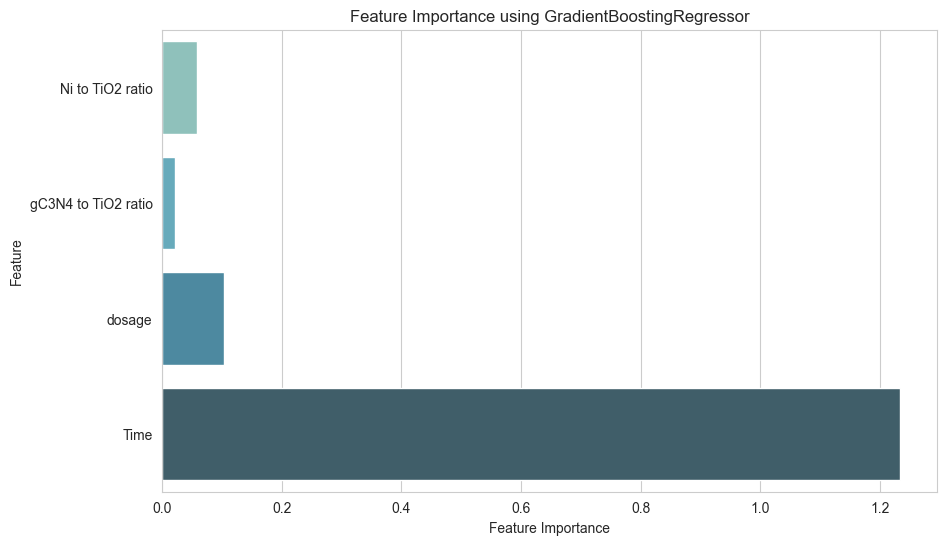

In [15]:
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
feature_names = X.columns
# Assuming `best_model_MLP` is your trained MLPRegressor model and `X_test_scaled` is your scaled test dataset
result = permutation_importance(best_model_GBR, X_test_scaled, y_test, n_repeats=10, random_state=42, n_jobs=-1)

# Get the importance of each feature
feature_importance = result.importances_mean

# Now let's plot this information
sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))

# Create a bar plot
sns.barplot(x=feature_importance, y=feature_names, palette="GnBu_d")

# Add chart labels and title
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importance using GradientBoostingRegressor')

plt.show()


In [16]:
y_train_pred = best_model_GBR.predict(X_train_scaled)
train_mse = mean_squared_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)
n = X_train_scaled.shape[0]  # Number of observations
p = X_train_scaled.shape[1]  # Number of predictors
train_adjusted_r_squared = 1 - (1 - train_r2) * (n - 1) / (n - p - 1)
print(f'MSE_train: {train_mse}, R2_train: {train_r2}, Adjust_R2_train: {train_adjusted_r_squared}')

MSE_train: 0.0014925493926188987, R2_train: 0.9701624422438051, Adjust_R2_train: 0.9691423547991489


In [17]:
n = len(y_train_pred)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(train_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_train.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'trainThe value of bic_test is: {bic_value}')

n = len(y_pred)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(test_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_test.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'testThe value of bic_test is: {bic_value}')

trainThe value of bic_test is: -428.44980728142485
testThe value of bic_test is: -104.70665593544506


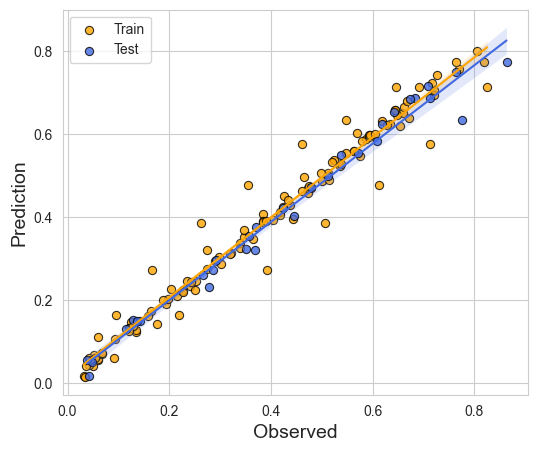

In [18]:
ax = regplot(y_train, y_train_pred, line_color='orange',
             marker_color='orange', marker_size=35, fill_color='orange',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Train")
_ = regplot(y_test, y_pred, line_color='royalblue', ax=ax,
                marker_color='royalblue', marker_size=35, fill_color='royalblue',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Test", ax_kws=dict(legend_kws=dict(loc=(0.1, 0.8))))
plt.show()

### KNeighborsRegressor

In [19]:
from sklearn.neighbors import KNeighborsRegressor

# Scaling the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the parameter grid to search
param_grid = {
    'n_neighbors': [1, 2, 3, 5, 6, 7, 8, 9, 10],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [10, 20, 30, 40, 50, 60, 70],
    'p': [1, 2]
}

# Initialize the KNeighborsRegressor model
neigh = KNeighborsRegressor()

# Initialize the Grid Search model
grid_search = GridSearchCV(neigh, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)

# Fit the model
grid_search.fit(X_train_scaled, y_train)

# Best model
best_model_KN = grid_search.best_estimator_

# Predictions
y_pred = best_model_KN.predict(X_test_scaled)

# Evaluate the model
n = X_test_scaled.shape[0]  # Number of observations
p = X_test_scaled.shape[1]  # Number of predictors

test_mse = mean_squared_error(y_test, y_pred)
test_r2 = r2_score(y_test, y_pred)
test_adjusted_r_squared = 1 - (1 - test_r2) * (n - 1) / (n - p - 1)

print(f'Best model parameters: {grid_search.best_params_}')
print(f'MSE_test: {test_mse}, R2_test: {test_r2}, Adjust_R2_test: {test_adjusted_r_squared}')


Fitting 5 folds for each of 1008 candidates, totalling 5040 fits
Best model parameters: {'algorithm': 'auto', 'leaf_size': 50, 'n_neighbors': 10, 'p': 2, 'weights': 'distance'}
MSE_test: 0.005335513528536362, R2_test: 0.9064114810427554, Adjust_R2_test: 0.8920132473570255


In [20]:
n = len(y_test)
log_likelihood = calculate_log_likelihood_from_mse(test_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_test.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'The value of bic_test is: {bic_value}')

The value of bic_test is: -60.52433653592138


In [21]:
y_train_pred = best_model_KN.predict(X_train_scaled)
train_mse = mean_squared_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)
n = X_train_scaled.shape[0]  # Number of observations
p = X_train_scaled.shape[1]  # Number of predictors
train_adjusted_r_squared = 1 - (1 - train_r2) * (n - 1) / (n - p - 1)
print(f'MSE_train: {train_mse}, R2_train: {train_r2}, Adjust_R2_train: {train_adjusted_r_squared}')

MSE_train: 0.001187105901639344, R2_train: 0.9762685636548794, Adjust_R2_train: 0.9754572324977812


In [22]:
n = len(y_train)
log_likelihood = calculate_log_likelihood_from_mse(train_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_train.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'The value of bic_test is: {bic_value}')

The value of bic_test is: -456.3838215509274


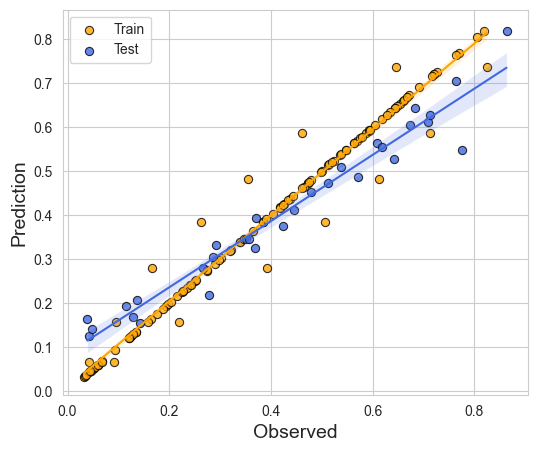

In [24]:
ax = regplot(y_train, y_train_pred, line_color='orange',
             marker_color='orange', marker_size=35, fill_color='orange',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Train")
_ = regplot(y_test, y_pred, line_color='royalblue', ax=ax,
                marker_color='royalblue', marker_size=35, fill_color='royalblue',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Test", ax_kws=dict(legend_kws=dict(loc=(0.1, 0.8))))
plt.show()

### Ridge

In [25]:
from sklearn.linear_model import Ridge
import numpy as np


# Scaling the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the parameter grid to search
param_grid = {
    'alpha': np.logspace(-4, 4, 20),  # Range of alpha values on a log scale
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
}

# Initialize the Ridge model
clf = Ridge()

# Initialize the Grid Search model
grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)

# Fit the model
grid_search.fit(X_train_scaled, y_train)

# Best model
best_model_Ridge = grid_search.best_estimator_

# Predictions
y_pred = best_model_Ridge.predict(X_test_scaled)

# Evaluate the model
n = X_test_scaled.shape[0]  # Number of observations
p = X_test_scaled.shape[1]  # Number of predictors

test_mse = mean_squared_error(y_test, y_pred)
test_r2 = r2_score(y_test, y_pred)
test_adjusted_r_squared = 1 - (1 - test_r2) * (n - 1) / (n - p - 1)

print(f'Best model parameters: {grid_search.best_params_}')
print(f'MSE_test: {test_mse}, R2_test: {test_r2}, Adjust_R2_test: {test_adjusted_r_squared}')


Fitting 5 folds for each of 140 candidates, totalling 700 fits
Best model parameters: {'alpha': 0.615848211066026, 'solver': 'sag'}
MSE_test: 0.00794135787939174, R2_test: 0.8607032072045747, Adjust_R2_test: 0.8392729313898939


In [26]:
n = len(y_test)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(test_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_test.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(bic_value)

-48.19566314783779


In [27]:
y_train_pred = best_model_Ridge.predict(X_train_scaled)
train_mse = mean_squared_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)
n = X_train_scaled.shape[0]  # Number of observations
p = X_train_scaled.shape[1]  # Number of predictors
train_adjusted_r_squared = 1 - (1 - train_r2) * (n - 1) / (n - p - 1)
print(f'MSE_train: {train_mse}, R2_train: {train_r2}, Adjust_R2_train: {train_adjusted_r_squared}')

MSE_train: 0.007054519350198131, R2_train: 0.8589730902074896, Adjust_R2_train: 0.8541516573940704


In [28]:
n = len(y_train)
log_likelihood = calculate_log_likelihood_from_mse(train_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_train.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'The value of bic_test is: {bic_value}')

The value of bic_test is: -238.96150636384343


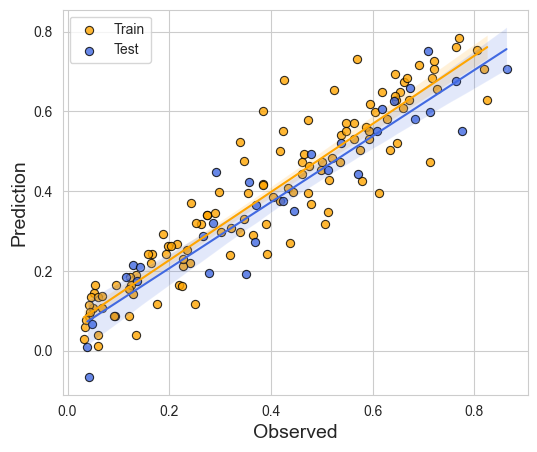

In [29]:
ax = regplot(y_train, y_train_pred, line_color='orange',
             marker_color='orange', marker_size=35, fill_color='orange',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Train")
_ = regplot(y_test, y_pred, line_color='royalblue', ax=ax,
                marker_color='royalblue', marker_size=35, fill_color='royalblue',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Test", ax_kws=dict(legend_kws=dict(loc=(0.1, 0.8))))
plt.show()

### ElasticNetCV

In [30]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

# Define the parameter grid to search
param_grid = {
    'alpha': [0.1, 0.5, 1, 5, 10],  # Regularization strength
    'l1_ratio': [0.1, 0.5, 0.9, 1]  # Mixing parameter between L1 and L2 regularization
}

# Create ElasticNet model
elastic_net = ElasticNet(random_state=0)

# Create GridSearchCV object
grid_search = GridSearchCV(elastic_net, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the model
grid_search.fit(X_train_scaled, y_train)

# Print the best parameters
print("Best parameters:", grid_search.best_params_)

# Use the best estimator for predictions
best_model_ENCV = grid_search.best_estimator_

# Predict and evaluate on test set
y_pred_test = best_model_ENCV.predict(X_test_scaled)
test_mse = mean_squared_error(y_test, y_pred_test)
test_r2 = r2_score(y_test, y_pred_test)
n_test = len(y_test)
p_test = X_test_scaled.shape[1]
test_adjusted_r_squared = 1 - (1 - test_r2) * (n_test - 1) / (n_test - p_test - 1)

print(f'MSE_test: {test_mse}, R2_test: {test_r2}, Adjust_R2_test: {test_adjusted_r_squared}')

# Predict and evaluate on training set
y_pred_train = best_model_ENCV.predict(X_train_scaled)
train_mse = mean_squared_error(y_train, y_pred_train)
train_r2 = r2_score(y_train, y_pred_train)
n_train = len(y_train)
p_train = X_train_scaled.shape[1]
train_adjusted_r_squared = 1 - (1 - train_r2) * (n_train - 1) / (n_train - p_train - 1)

print(f'MSE_train: {train_mse}, R2_train: {train_r2}, Adjust_R2_train: {train_adjusted_r_squared}')

# Add your BIC calculations here as before


Best parameters: {'alpha': 0.1, 'l1_ratio': 0.1}
MSE_test: 0.009730661054183175, R2_test: 0.8293176183200942, Adjust_R2_test: 0.8030587903693395
MSE_train: 0.008062884953388806, R2_train: 0.8388148515097607, Adjust_R2_train: 0.833304248142573


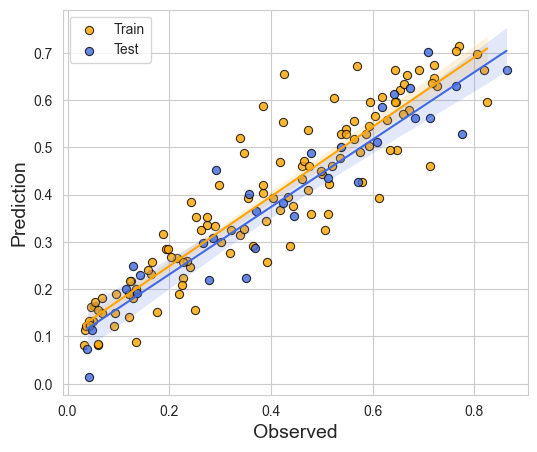

In [31]:
ax = regplot(y_train, y_pred_train, line_color='orange',
             marker_color='orange', marker_size=35, fill_color='orange',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Train")
_ = regplot(y_test, y_pred_test, line_color='royalblue', ax=ax,
                marker_color='royalblue', marker_size=35, fill_color='royalblue',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Test", ax_kws=dict(legend_kws=dict(loc=(0.1, 0.8))))
plt.show()

### MLPRegressor

In [32]:
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Scaling the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the parameter grid to search
param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 100), (50, 100, 50), (100, 50, 100)],
    'solver': ['adam'],
    'alpha': [0.0001, 0.001],
    'learning_rate_init': [0.0001, 0.001, 0.01],
    'max_iter': [1000, 2000, 3000],
}

# Initialize the MLPRegressor model
regr = MLPRegressor(random_state=42, max_iter=10000)
# regr = MLPRegressor(random_state=42, max_iter=10000, activation='logistic')
activation='tanh'
# Initialize the Grid Search model
grid_search = GridSearchCV(regr, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)

# Fit the model
grid_search.fit(X_train_scaled, y_train)

# Best model
best_model_MLP = grid_search.best_estimator_

# Predictions
y_pred_test = best_model_MLP.predict(X_test_scaled)
y_pred_train = best_model_MLP.predict(X_train_scaled)

# Evaluate the model
n_test = X_test_scaled.shape[0]  # Number of observations
p_test = X_test_scaled.shape[1]  # Number of predictors
test_mse = mean_squared_error(y_test, y_pred_test)
test_r2 = r2_score(y_test, y_pred_test)
test_adjusted_r_squared = 1 - (1 - test_r2) * (n_test - 1) / (n_test - p_test - 1)

n_train = X_train_scaled.shape[0]  # Number of observations
p_train = X_train_scaled.shape[1]  # Number of predictors
train_mse = mean_squared_error(y_train, y_pred_train)
train_r2 = r2_score(y_train, y_pred_train)
train_adjusted_r_squared = 1 - (1 - train_r2) * (n_train - 1) / (n_train - p_train - 1)

print(f'Best model parameters: {grid_search.best_params_}')
print(f'MSE_test: {test_mse}, R2_test: {test_r2}, Adjust_R2_test: {test_adjusted_r_squared}')
print(f'MSE_train: {train_mse}, R2_train: {train_r2}, Adjust_R2_train: {train_adjusted_r_squared}')

# Note: BIC calculation is omitted as it requires a specific function `calculate_log_likelihood_from_mse` and `em.bic`
# which are not standard in sklearn and need to be defined.


Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best model parameters: {'alpha': 0.001, 'hidden_layer_sizes': (50, 50), 'learning_rate_init': 0.01, 'max_iter': 1000, 'solver': 'adam'}
MSE_test: 0.0012766163811221813, R2_test: 0.9776072845197045, Adjust_R2_test: 0.9741622513688898
MSE_train: 0.0017339548965527025, R2_train: 0.9653365043539711, Adjust_R2_train: 0.9641514275797479


C:\Users\xs018\AppData\Local\Temp\ipykernel_6708\20394840.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importance, y=feature_names, palette="GnBu_d")


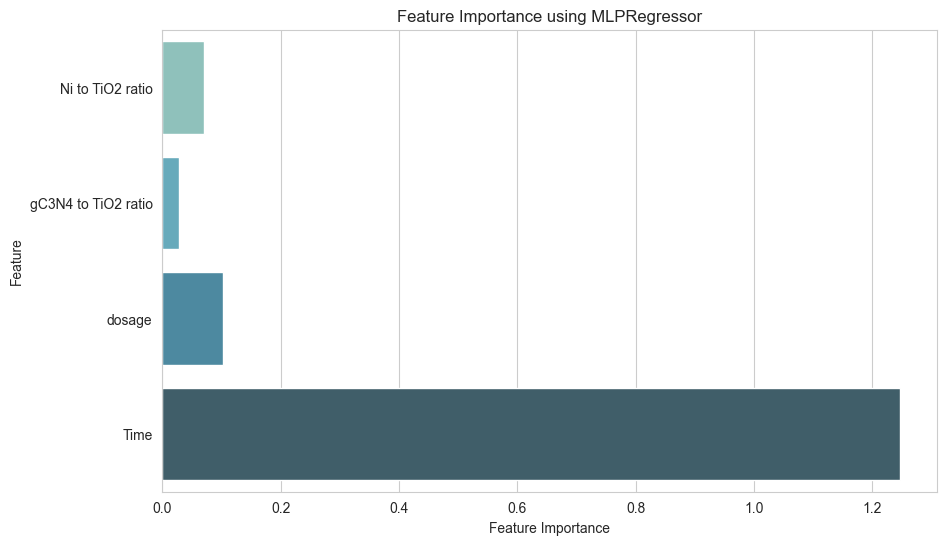

In [33]:
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
feature_names = X.columns
# Assuming `best_model_MLP` is your trained MLPRegressor model and `X_test_scaled` is your scaled test dataset
result = permutation_importance(best_model_MLP, X_test_scaled, y_test, n_repeats=10, random_state=42, n_jobs=-1)

# Get the importance of each feature
feature_importance = result.importances_mean

# Now let's plot this information
sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))

# Create a bar plot
sns.barplot(x=feature_importance, y=feature_names, palette="GnBu_d")

# Add chart labels and title
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importance using MLPRegressor')

plt.show()


In [34]:
n = len(y_pred_train)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(train_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_train.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'trainThe value of bic_test is: {bic_value}')

n = len(y_pred_test)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(test_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_test.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'testThe value of bic_test is: {bic_value}')

trainThe value of bic_test is: -410.1596640047654
testThe value of bic_test is: -104.85966887840938


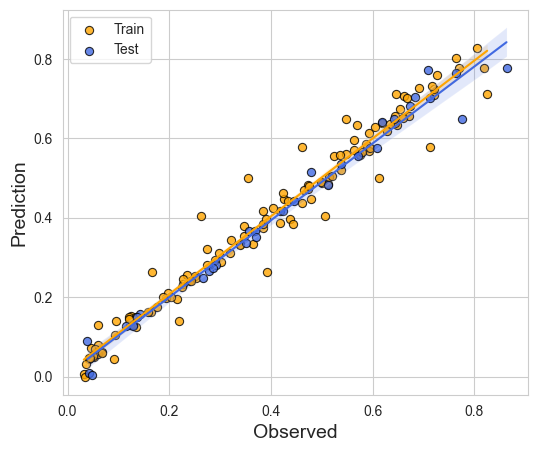

In [35]:
ax = regplot(y_train, y_pred_train, line_color='orange',
             marker_color='orange', marker_size=35, fill_color='orange',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Train")
_ = regplot(y_test, y_pred_test, line_color='royalblue', ax=ax,
                marker_color='royalblue', marker_size=35, fill_color='royalblue',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Test", ax_kws=dict(legend_kws=dict(loc=(0.1, 0.8))))
plt.show()

In [36]:
import numpy as np
import pandas as pd

# Generating x1 with values from 0.1 to 10, interval of 0.1
x1 = np.arange(0.1, 10.1, 0.01)

# Generating x2, x3, x4 with fixed values
x2 = np.full_like(x1, 1.5)
x3 = np.full_like(x1, 0.75)
x4 = np.full_like(x1, 4.5)

# Creating a DataFrame
data_fix_x1 = pd.DataFrame({'x1': x1, 'x2': x2, 'x3': x3, 'x4': x4})

# Display the first few rows of the DataFrame
data_fix_x1.head()
df_y1 = best_model_MLP.predict(data_fix_x1)
if isinstance(df_y1, np.ndarray):
    df_y1 = pd.DataFrame(df_y1)

data_fix_x1['y'] = df_y1.iloc[:,0]  
print(data_fix_x1)
min_y_index = data_fix_x1['y'].idxmin()

# Retrieve the row with the largest 'y' value
row_with_min_y = data_fix_x1.loc[min_y_index]

# Display the row
print(row_with_min_y)
max_y_index = data_fix_x1['y'].idxmax()

# Retrieve the row with the largest 'y' value
row_with_max_y = data_fix_x1.loc[max_y_index]

# Display the row
print(row_with_max_y)


        x1   x2    x3   x4         y
0     0.10  1.5  0.75  4.5  1.265832
1     0.11  1.5  0.75  4.5  1.265592
2     0.12  1.5  0.75  4.5  1.265352
3     0.13  1.5  0.75  4.5  1.265112
4     0.14  1.5  0.75  4.5  1.264872
..     ...  ...   ...  ...       ...
995  10.05  1.5  0.75  4.5  1.403401
996  10.06  1.5  0.75  4.5  1.403256
997  10.07  1.5  0.75  4.5  1.403111
998  10.08  1.5  0.75  4.5  1.402967
999  10.09  1.5  0.75  4.5  1.402822

[1000 rows x 5 columns]
x1    0.380000
x2    1.500000
x3    0.750000
x4    4.500000
y     1.260954
Name: 28, dtype: float64
x1    5.800000
x2    1.500000
x3    0.750000
x4    4.500000
y     1.432403
Name: 570, dtype: float64


c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(


In [38]:
import numpy as np
import pandas as pd
from itertools import product

# Define the columns as numpy arrays
column1 = np.arange(0, 10.1, 0.1)
column2 = np.arange(0, 2.6, 0.1)
column3 = np.arange(0, 1.6, 0.1)
column4 = np.arange(3, 5.1, 0.1)

# Create all combinations of the four columns
all_combinations = list(product(column1, column2, column3, column4))

# Convert to a pandas DataFrame
df_all_combinations = pd.DataFrame(all_combinations, columns=['Column 1', 'Column 2', 'Column 3', 'Column 4'])


# excel_filename = 'optimization_combination.xlsx'

# # Save the reduced DataFrame to an Excel file
# df.to_excel(excel_filename, index=False)


df_all_combinations.head()


,Column 1,Column 2,Column 3,Column 4
0,0.0,0.0,0.0,3.0
1,0.0,0.0,0.0,3.1
2,0.0,0.0,0.0,3.2
3,0.0,0.0,0.0,3.3
4,0.0,0.0,0.0,3.4


In [39]:
len(best_model_MLP.predict(df_all_combinations))

c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(


882336

In [40]:
import numpy as np
import pandas as pd

# Generating x1 with values from 0.1 to 10, interval of 0.1
x1 = np.arange(0.1, 10.1, 0.01)

# Generating x2 with values from 0.1 to 2.5, interval of 0.1
x2 = np.arange(0.1, 2.6, 0.01)

# Ensuring x1 and x2 have the same length by repeating x2 values
repeat_factor = len(x1) // len(x2) + 1
x2 = np.tile(x2, repeat_factor)[:len(x1)]

# Generating x3, x4 with fixed values
x3 = np.full_like(x1, 0.75)
x4 = np.full_like(x1, 4.5)

# Creating a DataFrame
df_fix_x3_x4 = pd.DataFrame({'x1': x1, 'x2': x2, 'x3': x3, 'x4': x4})

# Display the DataFrame
print(df_fix_x3_x4)


        x1    x2    x3   x4
0     0.10  0.10  0.75  4.5
1     0.11  0.11  0.75  4.5
2     0.12  0.12  0.75  4.5
3     0.13  0.13  0.75  4.5
4     0.14  0.14  0.75  4.5
..     ...   ...   ...  ...
995  10.05  2.55  0.75  4.5
996  10.06  2.56  0.75  4.5
997  10.07  2.57  0.75  4.5
998  10.08  2.58  0.75  4.5
999  10.09  2.59  0.75  4.5

[1000 rows x 4 columns]


In [41]:
df_y_fix_x3_x4 = best_model_MLP.predict(df_fix_x3_x4)
if isinstance(df_y_fix_x3_x4, np.ndarray):
    df_y_fix_x3_x4 = pd.DataFrame(df_y_fix_x3_x4)

df_fix_x3_x4['y'] = df_y_fix_x3_x4.iloc[:,0] 
df_fix_x3_x4

c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(


,x1,x2,x3,x4,y
0,0.10,0.10,0.75,4.5,1.177075
1,0.11,0.11,0.75,4.5,1.177766
2,0.12,0.12,0.75,4.5,1.178457
3,0.13,0.13,0.75,4.5,1.179148
4,0.14,0.14,0.75,4.5,1.179839
...,...,...,...,...,...
995,10.05,2.55,0.75,4.5,1.470348
996,10.06,2.56,0.75,4.5,1.470781
997,10.07,2.57,0.75,4.5,1.471215
998,10.08,2.58,0.75,4.5,1.471649


In [42]:
excel_filename = 'data_fix_x3_x4.xlsx'

# Save the reduced DataFrame to an Excel file
df_fix_x3_x4.to_excel(excel_filename, index=False)

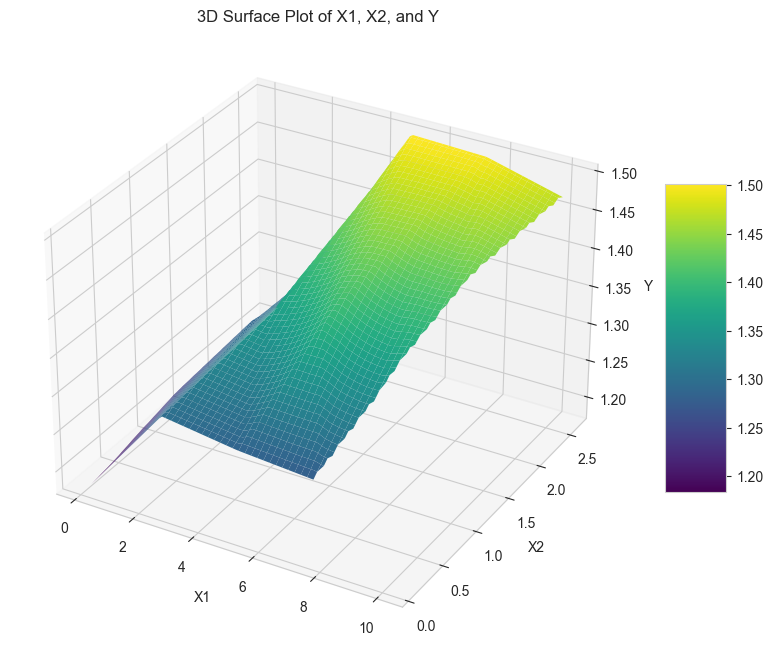

In [43]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata
import numpy as np
import pandas as pd



# Creating a 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a meshgrid for the surface plot
X1, X2 = np.meshgrid(np.linspace(min(df_fix_x3_x4['x1']), max(df_fix_x3_x4['x1']), 100),
                     np.linspace(min(df_fix_x3_x4['x2']), max(df_fix_x3_x4['x2']), 100))

# Interpolating the y-values on this grid
Y = griddata((df_fix_x3_x4['x1'], df_fix_x3_x4['x2']), df_fix_x3_x4['y'], (X1, X2), method='linear')

# Plotting the surface
surf = ax.plot_surface(X1, X2, Y, cmap='viridis', edgecolor='none')

# Setting labels
ax.set_xlabel('X1')
ax.set_ylabel('X2')
ax.set_zlabel('Y')

# Title
ax.set_title('3D Surface Plot of X1, X2, and Y')

# Adding a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()


In [45]:
import numpy as np
import pandas as pd

# Generating x1 with values from 0.1 to 10, interval of 0.1
x1 = np.arange(0.1, 10.1, 0.01)

# Generating x2 with values from 0.1 to 2.5, interval of 0.1
x3 = np.arange(0.1, 1.5, 0.01)

# Ensuring x1 and x2 have the same length by repeating x2 values
repeat_factor = len(x1) // len(x3) + 1
x3 = np.tile(x3, repeat_factor)[:len(x1)]

# Generating x3, x4 with fixed values
x2 = np.full_like(x1, 1.5)
x4 = np.full_like(x1, 4.5)

# Creating a DataFrame
data_fix_x1_x3 = pd.DataFrame({'x1': x1, 'x2': x2, 'x3': x3, 'x4': x4})

# Display the DataFrame
print(data_fix_x1_x3)

df_y_fix_x1_x3 = best_model_MLP.predict(data_fix_x1_x3)
if isinstance(df_y_fix_x1_x3, np.ndarray):
    df_y_fix_x1_x3 = pd.DataFrame(df_y_fix_x1_x3)

data_fix_x1_x3['y'] = df_y_fix_x1_x3.iloc[:,0] 
data_fix_x1_x3



        x1   x2    x3   x4
0     0.10  1.5  0.10  4.5
1     0.11  1.5  0.11  4.5
2     0.12  1.5  0.12  4.5
3     0.13  1.5  0.13  4.5
4     0.14  1.5  0.14  4.5
..     ...  ...   ...  ...
995  10.05  1.5  0.25  4.5
996  10.06  1.5  0.26  4.5
997  10.07  1.5  0.27  4.5
998  10.08  1.5  0.28  4.5
999  10.09  1.5  0.29  4.5

[1000 rows x 4 columns]


c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(


,x1,x2,x3,x4,y
0,0.10,1.5,0.10,4.5,1.252706
1,0.11,1.5,0.11,4.5,1.253097
2,0.12,1.5,0.12,4.5,1.253488
3,0.13,1.5,0.13,4.5,1.253879
4,0.14,1.5,0.14,4.5,1.254270
...,...,...,...,...,...
995,10.05,1.5,0.25,4.5,1.379975
996,10.06,1.5,0.26,4.5,1.380299
997,10.07,1.5,0.27,4.5,1.380623
998,10.08,1.5,0.28,4.5,1.380946


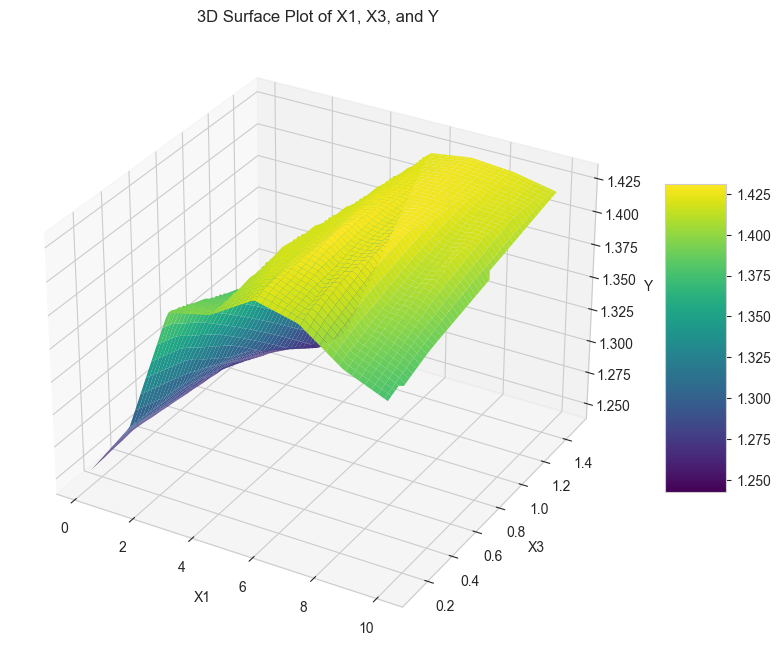

In [46]:
# Creating a 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a meshgrid for the surface plot
X1, X3 = np.meshgrid(np.linspace(min(data_fix_x1_x3['x1']), max(data_fix_x1_x3['x1']), 100),
                     np.linspace(min(data_fix_x1_x3['x3']), max(data_fix_x1_x3['x3']), 100))

# Interpolating the y-values on this grid
Y = griddata((data_fix_x1_x3['x1'], data_fix_x1_x3['x3']), data_fix_x1_x3['y'], (X1, X3), method='linear')

# Plotting the surface
surf = ax.plot_surface(X1, X3, Y, cmap='viridis', edgecolor='none')

# Setting labels
ax.set_xlabel('X1')
ax.set_ylabel('X3')
ax.set_zlabel('Y')

# Title
ax.set_title('3D Surface Plot of X1, X3, and Y')

# Adding a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()

In [47]:
import numpy as np
import pandas as pd

# Generating x1 with values from 0.1 to 10, interval of 0.1
x1 = np.arange(0.1, 10.1, 0.01)

# Generating x2 with values from 0.1 to 2.5, interval of 0.1
x4 = np.arange(3, 5, 0.01)

# Ensuring x1 and x2 have the same length by repeating x2 values
repeat_factor = len(x1) // len(x4) + 1
x4 = np.tile(x4, repeat_factor)[:len(x1)]

# Generating x3, x4 with fixed values
x2 = np.full_like(x1, 1.5)
x3 = np.full_like(x1, 0.75)

# Creating a DataFrame
data_fix_x1_x4 = pd.DataFrame({'x1': x1, 'x2': x2, 'x3': x3, 'x4': x4})
df_y_fix_x1_x4 = best_model_MLP.predict(data_fix_x1_x4)
df_y_fix_x1_x4

c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(


array([1.02868472, 1.03053185, 1.03237898, 1.03422611, 1.03607324,
       1.03792037, 1.0397675 , 1.04161463, 1.04346176, 1.04530889,
       1.04715602, 1.04900315, 1.05096508, 1.05297294, 1.0549808 ,
       1.05698866, 1.05899652, 1.06100438, 1.06301224, 1.0650201 ,
       1.06675937, 1.06846677, 1.07017418, 1.07188158, 1.07358898,
       1.07529638, 1.07700379, 1.07871119, 1.08041859, 1.08212599,
       1.08383339, 1.0855408 , 1.0872482 , 1.0889556 , 1.090663  ,
       1.0923704 , 1.09407781, 1.09578521, 1.09735734, 1.09873933,
       1.10012133, 1.10150333, 1.10288532, 1.10426732, 1.10564932,
       1.10703132, 1.10841331, 1.10979531, 1.11117731, 1.1125593 ,
       1.1139413 , 1.1153233 , 1.11670529, 1.11808729, 1.11946929,
       1.12085128, 1.12223328, 1.12361528, 1.12499727, 1.12637927,
       1.12776127, 1.12914327, 1.13052526, 1.13190726, 1.13328926,
       1.13467125, 1.13605325, 1.13743525, 1.13881724, 1.14019924,
       1.14158124, 1.14296323, 1.14434523, 1.14572723, 1.14710

        x1   x2    x3    x4         y
0     0.10  1.5  0.75  3.00  1.028685
1     0.11  1.5  0.75  3.01  1.030532
2     0.12  1.5  0.75  3.02  1.032379
3     0.13  1.5  0.75  3.03  1.034226
4     0.14  1.5  0.75  3.04  1.036073
..     ...  ...   ...   ...       ...
995  10.05  1.5  0.75  4.95  1.485702
996  10.06  1.5  0.75  4.96  1.487417
997  10.07  1.5  0.75  4.97  1.489132
998  10.08  1.5  0.75  4.98  1.490847
999  10.09  1.5  0.75  4.99  1.492562

[1000 rows x 5 columns]


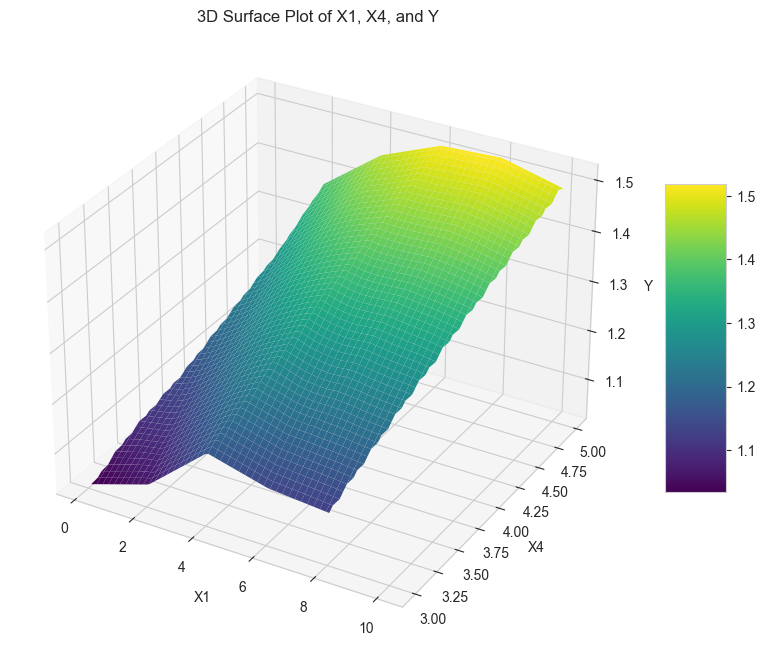

In [48]:
if isinstance(df_y_fix_x1_x4, np.ndarray):
    df_y_fix_x1_x4 = pd.DataFrame(df_y_fix_x1_x4)

data_fix_x1_x4['y'] = df_y_fix_x1_x4.iloc[:,0] 
data_fix_x1_x4

# Display the DataFrame
print(data_fix_x1_x4)



# Creating a 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a meshgrid for the surface plot
X1, X4 = np.meshgrid(np.linspace(min(data_fix_x1_x4['x1']), max(data_fix_x1_x4['x1']), 100),
                     np.linspace(min(data_fix_x1_x4['x4']), max(data_fix_x1_x4['x4']), 100))

# Interpolating the y-values on this grid
Y = griddata((data_fix_x1_x4['x1'], data_fix_x1_x4['x4']), data_fix_x1_x4['y'], (X1, X4), method='linear')

# Plotting the surface
surf = ax.plot_surface(X1, X4, Y, cmap='viridis', edgecolor='none')

# Setting labels
ax.set_xlabel('X1')
ax.set_ylabel('X4')
ax.set_zlabel('Y')

# Title
ax.set_title('3D Surface Plot of X1, X4, and Y')

# Adding a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()

In [ ]:
# import numpy as np
# import pandas as pd

# # Generating x1 with values from 0.1 to 10, interval of 0.1
# x2 = np.arange(0.1, 10.1, 0.01)

# # Generating x2 with values from 0.1 to 2.5, interval of 0.1
# x4 = np.arange(3, 5, 0.01)

# # Ensuring x1 and x2 have the same length by repeating x2 values
# repeat_factor = len(x1) // len(x4) + 1
# x4 = np.tile(x4, repeat_factor)[:len(x1)]

# # Generating x3, x4 with fixed values
# x2 = np.full_like(x1, 1.5)
# x3 = np.full_like(x1, 0.75)

# # Creating a DataFrame
# data_fix_x1_x4 = pd.DataFrame({'x1': x1, 'x2': x2, 'x3': x3, 'x4': x4})
# df_y_fix_x1_x4 = best_model_MLP.predict(data_fix_x1_x4)
# df_y_fix_x1_x4

# if isinstance(df_y_fix_x1_x4, np.ndarray):
#     df_y_fix_x1_x4 = pd.DataFrame(df_y_fix_x1_x4)

# data_fix_x1_x4['y'] = df_y_fix_x1_x4.iloc[:,0] 
# data_fix_x1_x4

# # Display the DataFrame
# print(data_fix_x1_x4)



# # Creating a 3D plot
# fig = plt.figure(figsize=(10, 8))
# ax = fig.add_subplot(111, projection='3d')

# # Creating a meshgrid for the surface plot
# X1, X4 = np.meshgrid(np.linspace(min(data_fix_x1_x4['x1']), max(data_fix_x1_x4['x1']), 100),
#                      np.linspace(min(data_fix_x1_x4['x4']), max(data_fix_x1_x4['x4']), 100))

# # Interpolating the y-values on this grid
# Y = griddata((data_fix_x1_x4['x1'], data_fix_x1_x4['x4']), data_fix_x1_x4['y'], (X1, X4), method='linear')

# # Plotting the surface
# surf = ax.plot_surface(X1, X4, Y, cmap='viridis', edgecolor='none')

# # Setting labels
# ax.set_xlabel('X1')
# ax.set_ylabel('X4')
# ax.set_zlabel('Y')

# # Title
# ax.set_title('3D Surface Plot of X1, X4, and Y')

# # Adding a color bar which maps values to colors.
# fig.colorbar(surf, shrink=0.5, aspect=5)

# plt.show()

c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(


        x1   x2    x3   x4         y
0     0.10  1.5  0.75  4.5  1.265832
1     0.11  1.5  0.75  4.5  1.265592
2     0.12  1.5  0.75  4.5  1.265352
3     0.13  1.5  0.75  4.5  1.265112
4     0.14  1.5  0.75  4.5  1.264872
..     ...  ...   ...  ...       ...
995  10.05  1.5  0.75  4.5  1.403401
996  10.06  1.5  0.75  4.5  1.403256
997  10.07  1.5  0.75  4.5  1.403111
998  10.08  1.5  0.75  4.5  1.402967
999  10.09  1.5  0.75  4.5  1.402822

[1000 rows x 5 columns]


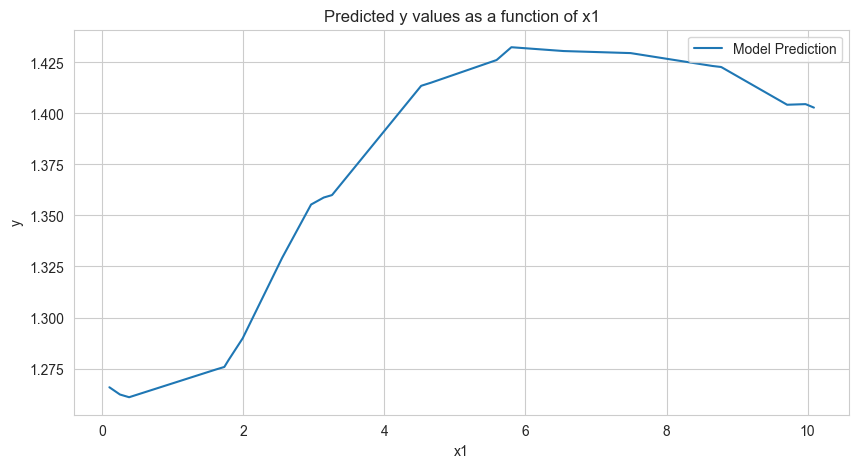

In [51]:
import numpy as np
import pandas as pd

# Generating x1 with values from 0.1 to 10, interval of 0.1
x1 = np.arange(0.1, 10.1, 0.01)


# Ensuring x1 and x2 have the same length by repeating x2 values


# Generating x3, x4 with fixed values
x2 = np.full_like(x1, 1.5)
x3 = np.full_like(x1, 0.75)
x4 = np.full_like(x1, 4.5)

# Creating a DataFrame
data_fix_x1 = pd.DataFrame({'x1': x1, 'x2': x2, 'x3': x3, 'x4': x4})
df_y_fix_x1 = best_model_MLP.predict(data_fix_x1)
df_y_fix_x1
if isinstance(df_y_fix_x1, np.ndarray):
    df_y_fix_x1 = pd.DataFrame(df_y_fix_x1)

data_fix_x1['y'] = df_y_fix_x1.iloc[:,0] 
data_fix_x1

# Display the DataFrame
print(data_fix_x1)

# Plotting the data
plt.figure(figsize=(10, 5))
plt.plot(data_fix_x1['x1'], data_fix_x1['y'], label='Model Prediction')
plt.xlabel('x1')
plt.ylabel('y')
plt.title('Predicted y values as a function of x1')
plt.legend()
plt.grid(True)
plt.show()



      x1    x2    x3   x4         y
0    7.5  0.10  0.75  4.5  1.279438
1    7.5  0.11  0.75  4.5  1.280684
2    7.5  0.12  0.75  4.5  1.281931
3    7.5  0.13  0.75  4.5  1.283177
4    7.5  0.14  0.75  4.5  1.284423
..   ...   ...   ...  ...       ...
235  7.5  2.45  0.75  4.5  1.491674
236  7.5  2.46  0.75  4.5  1.492352
237  7.5  2.47  0.75  4.5  1.493029
238  7.5  2.48  0.75  4.5  1.493668
239  7.5  2.49  0.75  4.5  1.494209

[240 rows x 5 columns]


c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(


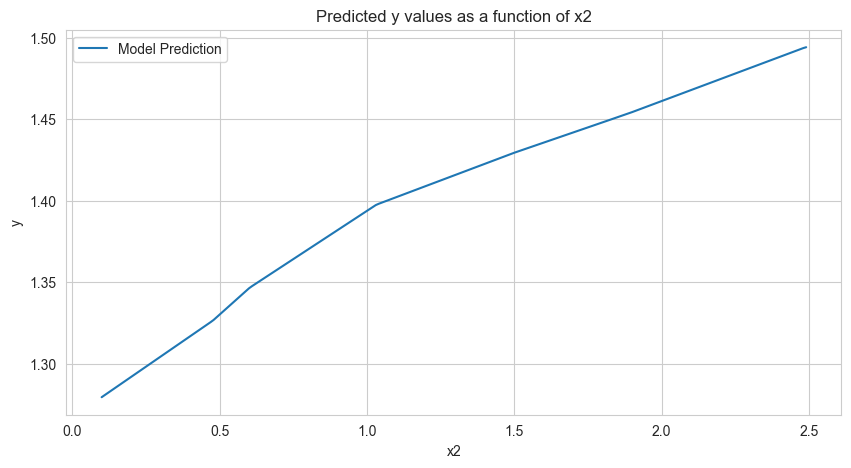

In [53]:
import numpy as np
import pandas as pd

# Generating x1 with values from 0.1 to 10, interval of 0.1
x2 = np.arange(0.1, 2.5, 0.01)


# Ensuring x1 and x2 have the same length by repeating x2 values


# Generating x3, x4 with fixed values
x1 = np.full_like(x2, 7.5)
x3 = np.full_like(x2, 0.75)
x4 = np.full_like(x2, 4.5)

# Creating a DataFrame
data_fix_x2 = pd.DataFrame({'x1': x1, 'x2': x2, 'x3': x3, 'x4': x4})
df_y_fix_x2 = best_model_MLP.predict(data_fix_x2)
df_y_fix_x2
if isinstance(df_y_fix_x2, np.ndarray):
    df_y_fix_x2 = pd.DataFrame(df_y_fix_x2)

data_fix_x2['y'] = df_y_fix_x2.iloc[:,0] 
data_fix_x2

# Display the DataFrame
print(data_fix_x2)

# Plotting the data
plt.figure(figsize=(10, 5))
plt.plot(data_fix_x2['x2'], data_fix_x2['y'], label='Model Prediction')
plt.xlabel('x2')
plt.ylabel('y')
plt.title('Predicted y values as a function of x2')
plt.legend()
plt.grid(True)
plt.show()



c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(


      x1   x2    x3   x4         y
0    7.5  1.5  0.10  4.5  1.404284
1    7.5  1.5  0.11  4.5  1.405056
2    7.5  1.5  0.12  4.5  1.405828
3    7.5  1.5  0.13  4.5  1.406600
4    7.5  1.5  0.14  4.5  1.407372
..   ...  ...   ...  ...       ...
135  7.5  1.5  1.45  4.5  1.426116
136  7.5  1.5  1.46  4.5  1.426097
137  7.5  1.5  1.47  4.5  1.426078
138  7.5  1.5  1.48  4.5  1.426059
139  7.5  1.5  1.49  4.5  1.426040

[140 rows x 5 columns]


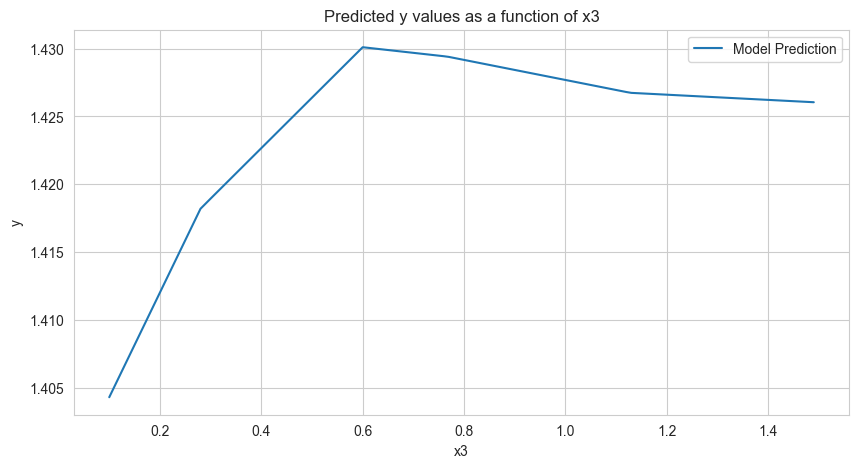

In [54]:
import numpy as np
import pandas as pd

# Generating x1 with values from 0.1 to 10, interval of 0.1
x3 = np.arange(0.1, 1.5, 0.01)


# Ensuring x1 and x2 have the same length by repeating x2 values


# Generating x3, x4 with fixed values
x1 = np.full_like(x3, 7.5)
x2 = np.full_like(x3, 1.5)
x4 = np.full_like(x3, 4.5)

# Creating a DataFrame
data_fix_x3 = pd.DataFrame({'x1': x1, 'x2': x2, 'x3': x3, 'x4': x4})
df_y_fix_x3 = best_model_MLP.predict(data_fix_x3)
df_y_fix_x3
if isinstance(df_y_fix_x3, np.ndarray):
    df_y_fix_x3 = pd.DataFrame(df_y_fix_x3)

data_fix_x3['y'] = df_y_fix_x3.iloc[:,0] 
data_fix_x3

# Display the DataFrame
print(data_fix_x3)

# Plotting the data
plt.figure(figsize=(10, 5))
plt.plot(data_fix_x3['x3'], data_fix_x3['y'], label='Model Prediction')
plt.xlabel('x3')
plt.ylabel('y')
plt.title('Predicted y values as a function of x3')
plt.legend()
plt.grid(True)
plt.show()



c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(


      x1   x2    x3    x4         y
0    7.5  1.5  0.75  3.00  1.127685
1    7.5  1.5  0.75  3.01  1.129720
2    7.5  1.5  0.75  3.02  1.131755
3    7.5  1.5  0.75  3.03  1.133789
4    7.5  1.5  0.75  3.04  1.135824
..   ...  ...   ...   ...       ...
195  7.5  1.5  0.75  4.95  1.514317
196  7.5  1.5  0.75  4.96  1.516203
197  7.5  1.5  0.75  4.97  1.518089
198  7.5  1.5  0.75  4.98  1.519975
199  7.5  1.5  0.75  4.99  1.521860

[200 rows x 5 columns]


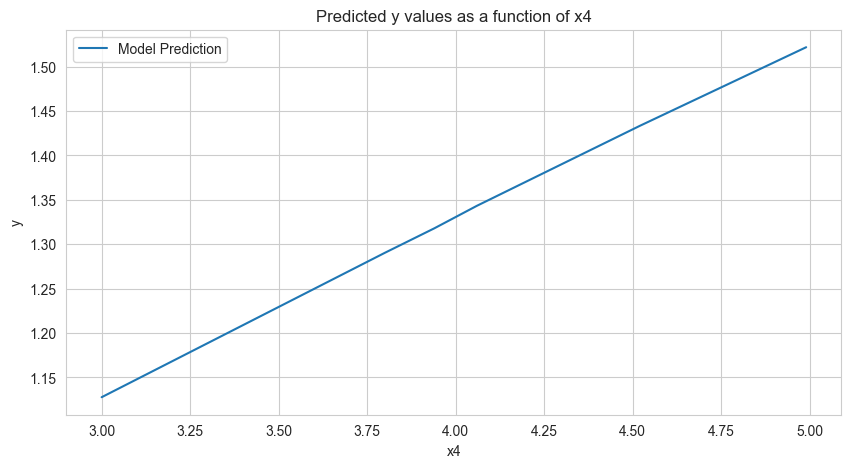

In [56]:
import numpy as np
import pandas as pd

# Generating x1 with values from 0.1 to 10, interval of 0.1
x4 = np.arange(3, 5, 0.01)


# Ensuring x1 and x2 have the same length by repeating x2 values


# Generating x3, x4 with fixed values
x1 = np.full_like(x4, 7.5)
x2 = np.full_like(x4, 1.5)
x3 = np.full_like(x4, 0.75)

# Creating a DataFrame
data_fix_x4 = pd.DataFrame({'x1': x1, 'x2': x2, 'x3': x3, 'x4': x4})
df_y_fix_x4 = best_model_MLP.predict(data_fix_x4)
df_y_fix_x4
if isinstance(df_y_fix_x4, np.ndarray):
    df_y_fix_x4 = pd.DataFrame(df_y_fix_x4)

data_fix_x4['y'] = df_y_fix_x4.iloc[:,0] 
data_fix_x4

# Display the DataFrame
print(data_fix_x4)

# Plotting the data
plt.figure(figsize=(10, 5))
plt.plot(data_fix_x4['x4'], data_fix_x4['y'], label='Model Prediction')
plt.xlabel('x4')
plt.ylabel('y')
plt.title('Predicted y values as a function of x4')
plt.legend()
plt.grid(True)
plt.show()



In [63]:
data_fix_x1_x4['y']

0       0.10
1       0.11
2       0.12
3       0.13
4       0.14
       ...  
995    10.05
996    10.06
997    10.07
998    10.08
999    10.09
Name: y, Length: 1000, dtype: float64

In [ ]:
import numpy as np
import pandas as pd

# Generating x1 with values from 0.1 to 10, interval of 0.1
x1 = np.arange(0.1, 10.1, 0.01)

# Generating x2 with values from 0.1 to 2.5, interval of 0.1
x4 = np.arange(0.1, 1.5, 0.01)

# Ensuring x1 and x2 have the same length by repeating x2 values
repeat_factor = len(x1) // len(x4) + 1
x4 = np.tile(x4, repeat_factor)[:len(x1)]

# Generating x3, x4 with fixed values
x2 = np.full_like(x1, 1.5)
x3 = np.full_like(x1, 0.75)

# Creating a DataFrame
data_fix_x1_x4 = pd.DataFrame({'x1': x1, 'x2': x2, 'x3': x3, 'x4': x4})

# Display the DataFrame
print(data_fix_x1_x4)

df_y_fix_x1_x4 = best_model_MLP.predict(data_fix_x1_x4)
if isinstance(df_y_fix_x1_x4, np.ndarray):
    df_y_fix_x1_x4 = pd.DataFrame(df_y_fix_x1_x4)

data_fix_x1_x4['y'] = data_fix_x1_x4.iloc[:,0] 
data_fix_x1_x4

# Creating a 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Creating a meshgrid for the surface plot
X1, X4 = np.meshgrid(np.linspace(min(data_fix_x1_x4['x1']), max(data_fix_x1_x4['x1']), 100),
                     np.linspace(min(data_fix_x1_x4['x4']), max(data_fix_x1_x4['x4']), 100))

# Interpolating the y-values on this grid
Y = griddata((data_fix_x1_x4['x1'], data_fix_x1_x4['x4']), data_fix_x1_x4['y'], (X1, X4), method='linear')

# Plotting the surface
surf = ax.plot_surface(X1, X4, Y, cmap='viridis', edgecolor='none')

# Setting labels
ax.set_xlabel('X1')
ax.set_ylabel('X4')
ax.set_zlabel('Y')

# Title
ax.set_title('3D Surface Plot of X1, X4, and Y')

# Adding a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()

In [44]:
import numpy as np
import pandas as pd
from itertools import product

# Define the columns as numpy arrays
column1 = np.arange(0, 10.1, 0.1)
column2 = np.arange(0, 2.6, 0.1)
column3 = np.arange(0, 1.6, 0.1)
column4 = np.arange(3, 5.1, 0.1)

# Create all combinations of the four columns
all_combinations = list(product(column1, column2, column3, column4))

# Convert to a pandas DataFrame
df = pd.DataFrame(all_combinations, columns=['Column 1', 'Column 2', 'Column 3', 'Column 4'])

df_y = best_model_MLP.predict(df)
df_y = pd.DataFrame(df_y)

# Define the path for the Excel file
excel_filename = 'df_y.xlsx'

# Save the DataFrame to an Excel file
df_y.to_excel(excel_filename, index=False)
# Assuming df is your primary DataFrame and df_y is the data you want to add as a new column
if isinstance(df_y, np.ndarray):
    df_y = pd.DataFrame(df_y)

df['y'] = df_y.iloc[:,0]  

# print(df)
# df = df[df['y'] <= 1]

# # Display the DataFrame after the operation
# max_y_index = df['y'].idxmax()

# # Retrieve the row with the largest 'y' value
# row_with_max_y = df.loc[max_y_index]

# # Display the row
# print(row_with_max_y)

c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(


In [45]:
max_y_index = df['y'].idxmax()

# Retrieve the row with the largest 'y' value
row_with_max_y = df.loc[max_y_index]

# Display the row
print(row_with_max_y)

Column 1    6.100000
Column 2    2.500000
Column 3    0.000000
Column 4    5.000000
y           1.603389
Name: 541316, dtype: float64


In [ ]:
df_y

In [39]:

df = df[(df['y'] <= 1) & (df['y'] >= 0.9999)]

# Display the DataFrame after the operation
print(df)


        Column 1  Column 2  Column 3  Column 4         y
1556         0.0       0.4       1.0       3.2  0.999902
9285         0.1       0.1       1.0       3.3  0.999949
10376        0.1       0.4       1.4       3.2  0.999914
28771        0.3       0.7       1.0       3.1  0.999985
29736        0.3       1.0       0.8       3.0  0.999975
35764        0.4       0.2       0.7       3.1  0.999978
38493        0.4       1.0       0.9       3.0  0.999907
63358        0.7       0.6       0.9       3.1  0.999922
73080        0.8       0.9       0.8       3.0  0.999948
79907        0.9       0.3       1.3       3.2  0.999993
92001        1.0       1.3       1.3       3.0  0.999960
132365       1.5       0.3       1.5       3.2  0.999906
144103       1.6       1.2       1.4       3.1  0.999951
174994       2.0       0.0       1.3       3.1  0.999985
436863       5.0       0.0       0.3       3.0  0.999914
498289       5.7       0.1       0.0       3.1  0.999982
550411       6.3       0.0     

### AdaBoostRegressor & DecisionTreeRegressor

In [81]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import numpy as np


# Scaling the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# AdaBoostRegressor parameter grid
param_grid1 = {
    'n_estimators': [50, 100, 200, 300, 400, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.5, 1.0],
    'loss': ['linear', 'square', 'exponential'],
    'random_state': list(range(10))
}

# DecisionTreeRegressor parameter grid
param_grid2 = {
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 6, 8],
    'max_leaf_nodes': [None, 10, 20, 30, 40, 50],
}

# Initialize models
base_estimator = DecisionTreeRegressor()  # Default base estimator for AdaBoost

regr_1 = AdaBoostRegressor(random_state=0)
regr_2 = DecisionTreeRegressor(random_state=0)

# Grid search for AdaBoostRegressor
grid_search1 = GridSearchCV(regr_1, param_grid1, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
grid_search1.fit(X_train_scaled, y_train)
best_model_ABR = grid_search1.best_estimator_


# Grid search for DecisionTreeRegressor
grid_search2 = GridSearchCV(regr_2, param_grid2, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
grid_search2.fit(X_train_scaled, y_train)
best_model_DT = grid_search2.best_estimator_

# Evaluate AdaBoostRegressor
n_test = len(y_test)
p_test = len(X_test.columns)
y_pred_test1 = best_model_ABR.predict(X_test_scaled)
test_mse1 = mean_squared_error(y_test, y_pred_test1)
test_r21 = r2_score(y_test, y_pred_test1)
test_adjusted_r_squared1 = 1 - (1 - test_r21) * (n_test - 1) / (n_test - p_test - 1)

# Evaluate DecisionTreeRegressor
y_pred_test2 = best_model_DT.predict(X_test_scaled)
test_mse2 = mean_squared_error(y_test, y_pred_test2)
test_r22 = r2_score(y_test, y_pred_test2)
test_adjusted_r_squared2 = 1 - (1 - test_r22) * (n_test - 1) / (n_test - p_test - 1)

# Print results
print(f'Best model parameters AdaBoostRegressor: {grid_search1.best_params_}')
print(f'Best model parameters DecisionTreeRegressor: {grid_search2.best_params_}')
print(f'AdaBoostRegressor - MSE_test: {test_mse1}, R2_test: {test_r21}, Adjust_R2_test: {test_adjusted_r_squared1}')
print(f'DecisionTreeRegressor - MSE_test: {test_mse2}, R2_test: {test_r22}, Adjust_R2_test: {test_adjusted_r_squared2}')


Fitting 5 folds for each of 900 candidates, totalling 4500 fits
Fitting 5 folds for each of 2880 candidates, totalling 14400 fits
Best model parameters AdaBoostRegressor: {'learning_rate': 0.5, 'loss': 'square', 'n_estimators': 100, 'random_state': 0}
Best model parameters DecisionTreeRegressor: {'criterion': 'absolute_error', 'max_depth': 10, 'max_leaf_nodes': 50, 'min_samples_leaf': 1, 'min_samples_split': 2}
AdaBoostRegressor - MSE_test: 0.0046755147748120994, R2_test: 0.9179883059433616, Adjust_R2_test: 0.9053711222423403
DecisionTreeRegressor - MSE_test: 0.006052488805303852, R2_test: 0.8938352493599473, Adjust_R2_test: 0.8775022107999392


In [82]:
n = len(y_test)
p = len(X_test.columns)

log_likelihood = calculate_log_likelihood_from_mse(test_mse1, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_test.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'AdaBoostRegressorbic_value_test1:{bic_value}')

y_pred_trian1 = best_model_ABR.predict(X_train_scaled)
train_mse1 = mean_squared_error(y_train, y_train_pred)
train_r21 = r2_score(y_train, y_train_pred)
n = X_train_scaled.shape[0]  # Number of observations
p = X_train_scaled.shape[1]  # Number of predictors
train_adjusted_r_squared1 = 1 - (1 - train_r21) * (n - 1) / (n - p - 1)
print(f'AdaBoostRegressorMSE_train1: {train_mse1}, R2_train1: {train_r21}, Adjust_R2_train1: {train_adjusted_r_squared1}')


n = len(y_train)
log_likelihood = calculate_log_likelihood_from_mse(train_mse1, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_train.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'AdaBoostRegressorbic_value_train1:{bic_value}')

AdaBoostRegressorbic_value_test1:-64.61775843473757
AdaBoostRegressorMSE_train1: 0.007054526003049755, R2_train1: 0.8589729572103201, Adjust_R2_train1: 0.8541515198499892
AdaBoostRegressorbic_value_train1:-238.9613913102905


In [83]:
n = len(y_test)
p = len(X_test.columns)


log_likelihood = calculate_log_likelihood_from_mse(test_mse2, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_test.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'DecisionTreeRegressorbic_value_test:{bic_value}')

y_pred_trian2 = best_model_DT.predict(X_train_scaled)
train_mse2 = mean_squared_error(y_train, y_train_pred)
train_r22 = r2_score(y_train, y_train_pred)
n = X_train_scaled.shape[0]  # Number of observations
p = X_train_scaled.shape[1]  # Number of predictors
train_adjusted_r_squared2 = 1 - (1 - train_r22) * (n - 1) / (n - p - 1)
print(f'DecisionTreeRegressorMSE_train: {train_mse2}, R2_train1: {train_r22}, Adjust_R2_train1: {train_adjusted_r_squared2}')


n = len(y_train)
log_likelihood = calculate_log_likelihood_from_mse(train_mse2, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_train.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'DecisionTreeRegressorbic_value_train:{bic_value}')

DecisionTreeRegressorbic_value_test:-56.61571940469639
DecisionTreeRegressorMSE_train: 0.007054526003049755, R2_train1: 0.8589729572103201, Adjust_R2_train1: 0.8541515198499892
DecisionTreeRegressorbic_value_train:-238.9613913102905


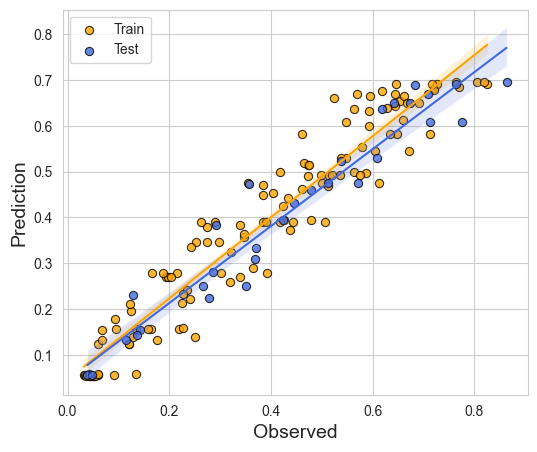

In [84]:
ax = regplot(y_train, y_pred_trian1, line_color='orange',
             marker_color='orange', marker_size=35, fill_color='orange',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Train")
_ = regplot(y_test, y_pred_test1, line_color='royalblue', ax=ax,
                marker_color='royalblue', marker_size=35, fill_color='royalblue',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Test", ax_kws=dict(legend_kws=dict(loc=(0.1, 0.8))))
plt.show()

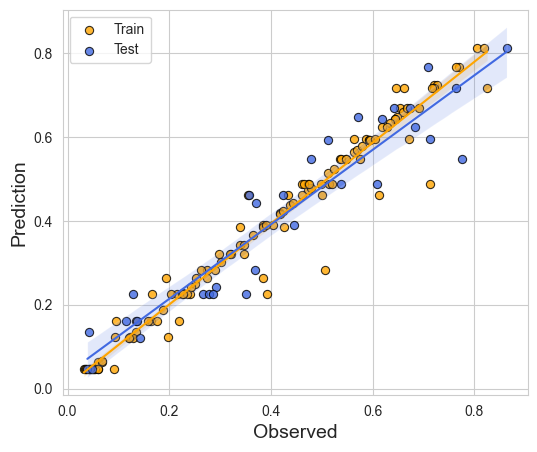

In [85]:
ax = regplot(y_train, y_pred_trian2, line_color='orange',
             marker_color='orange', marker_size=35, fill_color='orange',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Train")
_ = regplot(y_test, y_pred_test2, line_color='royalblue', ax=ax,
                marker_color='royalblue', marker_size=35, fill_color='royalblue',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Test", ax_kws=dict(legend_kws=dict(loc=(0.1, 0.8))))
plt.show()

### ExtraTreesRegressor

In [86]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import numpy as np


# Scaling the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the parameter grid to search
param_grid = {
    'n_estimators': [100, 300, 500, 1000],
    'max_depth': [None, 10, 20, 30, 40],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2'],
}

# Initialize the ExtraTreesRegressor model
reg = ExtraTreesRegressor(random_state=42)

# Initialize the Grid Search model
grid_search = GridSearchCV(reg, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)

# Fit the model
grid_search.fit(X_train_scaled, y_train)

# Best model
best_model_ETR = grid_search.best_estimator_

# Predictions on test and train data
y_pred_test = best_model_ETR.predict(X_test_scaled)
y_pred_train = best_model_ETR.predict(X_train_scaled)

# Evaluate the model on test data
n_test = len(y_test)
p_test = X_test_scaled.shape[1]
test_mse = mean_squared_error(y_test, y_pred_test)
test_r2 = r2_score(y_test, y_pred_test)
test_adjusted_r_squared = 1 - (1 - test_r2) * (n_test - 1) / (n_test - p_test - 1)

# Evaluate the model on train data
n_train = X_train_scaled.shape[0]
p_train = X_train_scaled.shape[1]
train_mse = mean_squared_error(y_train, y_pred_train)
train_r2 = r2_score(y_train, y_pred_train)
train_adjusted_r_squared = 1 - (1 - train_r2) * (n_train - 1) / (n_train - p_train - 1)

# Print results
print(f'Best model parameters: {grid_search.best_params_}')
print(f'MSE_test: {test_mse}, R2_test: {test_r2}, Adjust_R2_test: {test_adjusted_r_squared}')
print(f'MSE_train: {train_mse}, R2_train: {train_r2}, Adjust_R2_train: {train_adjusted_r_squared}')


Fitting 5 folds for each of 540 candidates, totalling 2700 fits


c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\model_selection\_validation.py:542: FitFailedWarning: 
900 fits failed out of a total of 2700.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
870 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\model_selection\_validation.py", line 890, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\base.py", line 1344, in wrapper
    estimator._validate_params()
  File "c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\base.py", line 666, in _validate_params
    validate_parameter_constraints(

Best model parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 500}
MSE_test: 0.003944987410210312, R2_test: 0.9308022504203377, Adjust_R2_test: 0.9201564427926974
MSE_train: 0.0018807972513357482, R2_train: 0.9624009785592723, Adjust_R2_train: 0.9611155419288201


In [87]:
n = len(y_pred_train)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(train_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_train.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'trainThe value of bic_test is: {bic_value}')

n = len(y_pred_test)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(test_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_test.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'testThe value of bic_test is: {bic_value}')

trainThe value of bic_test is: -400.2421754242387
testThe value of bic_test is: -69.88445711991457


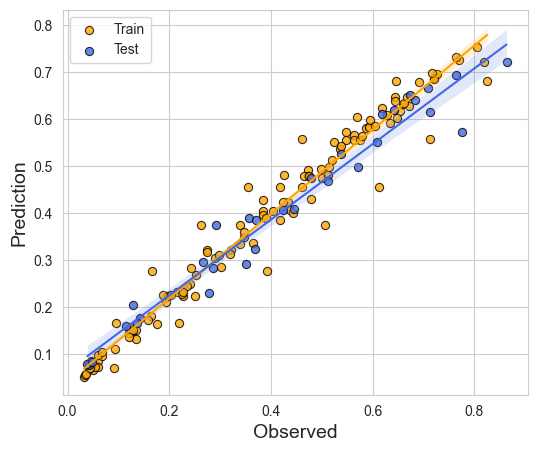

In [88]:
ax = regplot(y_train, y_pred_train, line_color='orange',
             marker_color='orange', marker_size=35, fill_color='orange',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Train")
_ = regplot(y_test, y_pred_test, line_color='royalblue', ax=ax,
                marker_color='royalblue', marker_size=35, fill_color='royalblue',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Test", ax_kws=dict(legend_kws=dict(loc=(0.1, 0.8))))
plt.show()

### xgboost

In [89]:
import xgboost as xg
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Scaling the data (assuming this is necessary for your dataset)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the parameter grid to search
param_grid = {
    'learning_rate': [0.01, 0.09, 0.1, 0.11, 0.2, 0.3],
    'n_estimators': [200, 300],
    'max_depth': [3, 8],
    'min_child_weight': [1, 2],
    'subsample': [0.5, 0.7],
    'colsample_bytree': [0.5, 0.7]
}

# Initialize the XGBRegressor model
xgb_r = xg.XGBRegressor(objective ='reg:linear', seed=1234)

# Initialize the Grid Search model
grid_search = GridSearchCV(xgb_r, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs = -1)

# Fit the model
grid_search.fit(X_train_scaled, y_train)

# Best model
best_model_XGB = grid_search.best_estimator_

# Predictions on test and train data
y_pred_test = best_model_XGB.predict(X_test_scaled)
y_pred_train = best_model_XGB.predict(X_train_scaled)

# Evaluate the model on test data
n_test = len(y_test)
p_test = len(X_test.columns)
test_mse = mean_squared_error(y_test, y_pred_test)
test_r2 = r2_score(y_test, y_pred_test)
test_adjusted_r_squared = 1 - (1 - test_r2) * (n_test - 1) / (n_test - p_test - 1)

# Evaluate the model on train data
n_train = X_train_scaled.shape[0]
p_train = X_train_scaled.shape[1]
train_mse = mean_squared_error(y_train, y_pred_train)
train_r2 = r2_score(y_train, y_pred_train)
train_adjusted_r_squared = 1 - (1 - train_r2) * (n_train - 1) / (n_train - p_train - 1)

# Print results
print(f'Best model parameters: {grid_search.best_params_}')
print(f'MSE_test: {test_mse}, R2_test: {test_r2}, Adjust_R2_test: {test_adjusted_r_squared}')
print(f'MSE_train: {train_mse}, R2_train: {train_r2}, Adjust_R2_train: {train_adjusted_r_squared}')


Fitting 5 folds for each of 192 candidates, totalling 960 fits
Best model parameters: {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 300, 'subsample': 0.5}
MSE_test: 0.0019061521231738625, R2_test: 0.9665648014645769, Adjust_R2_test: 0.9614209247668195
MSE_train: 0.0015458799299569736, R2_train: 0.9690963113701047, Adjust_R2_train: 0.9680397750066895


c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\xgboost\core.py:160: UserWarning: [22:35:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserWarning)


In [91]:
n = len(y_pred_train)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(train_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_train.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'trainThe value of bic_test is: {bic_value}')

n = len(y_pred_test)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(test_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_test.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'testThe value of bic_test is: {bic_value}')

trainThe value of bic_test is: -424.1666773290444
testThe value of bic_test is: -92.43259071192769


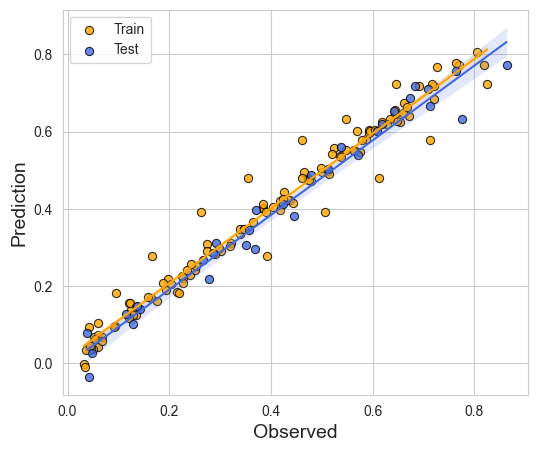

In [93]:
ax = regplot(y_train, y_pred_train, line_color='orange',
             marker_color='orange', marker_size=35, fill_color='orange',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Train")
_ = regplot(y_test, y_pred_test, line_color='royalblue', ax=ax,
                marker_color='royalblue', marker_size=35, fill_color='royalblue',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Test", ax_kws=dict(legend_kws=dict(loc=(0.1, 0.8))))
plt.show()

### RandomForestRegressor

In [94]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Scaling the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the parameter grid to search
param_grid = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [None, 5, 10, 15, 20],
    'min_samples_split': [2, 4, 6, 8],
    'min_samples_leaf': [1, 2, 4, 6],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Initialize the RandomForestRegressor model
regr = RandomForestRegressor(random_state=0)

# Initialize the Grid Search model
grid_search = GridSearchCV(regr, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs = -1)

# Fit the model
grid_search.fit(X_train_scaled, y_train)

# Best model
best_model_RF = grid_search.best_estimator_

# Predictions on test and train data
y_pred_test = best_model_RF.predict(X_test_scaled)
y_pred_train = best_model_RF.predict(X_train_scaled)

# Evaluate the model on test data
n_test = len(y_test)
p_test = X_test_scaled.shape[1]
test_mse = mean_squared_error(y_test, y_pred_test)
test_r2 = r2_score(y_test, y_pred_test)
test_adjusted_r_squared = 1 - (1 - test_r2) * (n_test - 1) / (n_test - p_test - 1)

# Evaluate the model on train data
n_train = X_train_scaled.shape[0]
p_train = X_train_scaled.shape[1]
train_mse = mean_squared_error(y_train, y_pred_train)
train_r2 = r2_score(y_train, y_pred_train)
train_adjusted_r_squared = 1 - (1 - train_r2) * (n_train - 1) / (n_train - p_train - 1)

# Print results
print(f'Best model parameters: {grid_search.best_params_}')
print(f'MSE_test: {test_mse}, R2_test: {test_r2}, Adjust_R2_test: {test_adjusted_r_squared}')
print(f'MSE_train: {train_mse}, R2_train: {train_r2}, Adjust_R2_train: {train_adjusted_r_squared}')


Fitting 5 folds for each of 1200 candidates, totalling 6000 fits
Best model parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 100}
MSE_test: 0.0031795112398165224, R2_test: 0.9442292206081296, Adjust_R2_test: 0.935649100701688
MSE_train: 0.0019524551549452607, R2_train: 0.9609684652714641, Adjust_R2_train: 0.9596340538277535


c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\model_selection\_validation.py:542: FitFailedWarning: 
2000 fits failed out of a total of 6000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1794 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\model_selection\_validation.py", line 890, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\base.py", line 1344, in wrapper
    estimator._validate_params()
  File "c:\Users\xs018\.conda\envs\pytorch2x\lib\site-packages\sklearn\base.py", line 666, in _validate_params
    validate_parameter_constraint

In [95]:
n = len(y_pred_train)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(train_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_train.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'trainThe value of bic_test is: {bic_value}')

n = len(y_pred_test)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(test_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_test.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'testThe value of bic_test is: {bic_value}')

trainThe value of bic_test is: -395.68036635203015
testThe value of bic_test is: -76.57172368075535


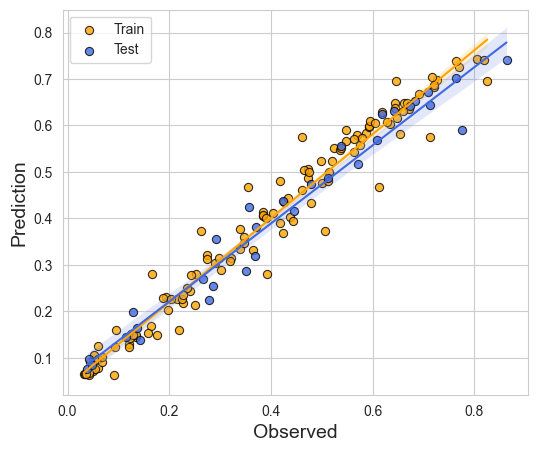

In [96]:
ax = regplot(y_train, y_pred_train, line_color='orange',
             marker_color='orange', marker_size=35, fill_color='orange',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Train")
_ = regplot(y_test, y_pred_test, line_color='royalblue', ax=ax,
                marker_color='royalblue', marker_size=35, fill_color='royalblue',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Test", ax_kws=dict(legend_kws=dict(loc=(0.1, 0.8))))
plt.show()

### LASSO

In [97]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import numpy as np


scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the parameter grid to search
param_grid = {
    'alpha': np.logspace(-4, 4, 50),
    'max_iter': [1000, 5000, 10000],
    'tol': [0.0001, 0.001, 0.01]
}

# Initialize the Lasso model
clf = Lasso()

# Initialize the Grid Search model
grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs = -1)

# Fit the model
grid_search.fit(X_train_scaled, y_train)

# Best model
best_model_LASSO = grid_search.best_estimator_

# Predictions on test and train data
y_pred_test = best_model_LASSO.predict(X_test_scaled)
y_pred_train = best_model_LASSO.predict(X_train_scaled)

# Evaluate the model on test data
n_test = len(y_test)
p_test = X_test_scaled.shape[1]
test_mse = mean_squared_error(y_test, y_pred_test)
test_r2 = r2_score(y_test, y_pred_test)
test_adjusted_r_squared = 1 - (1 - test_r2) * (n_test - 1) / (n_test - p_test - 1)

# Evaluate the model on train data
n_train = X_train_scaled.shape[0]
p_train = X_train_scaled.shape[1]
train_mse = mean_squared_error(y_train, y_pred_train)
train_r2 = r2_score(y_train, y_pred_train)
train_adjusted_r_squared = 1 - (1 - train_r2) * (n_train - 1) / (n_train - p_train - 1)

# Print results
print(f'Best model parameters: {grid_search.best_params_}')
print(f'MSE_test: {test_mse}, R2_test: {test_r2}, Adjust_R2_test: {test_adjusted_r_squared}')
print(f'MSE_train: {train_mse}, R2_train: {train_r2}, Adjust_R2_train: {train_adjusted_r_squared}')


Fitting 5 folds for each of 450 candidates, totalling 2250 fits
Best model parameters: {'alpha': 0.0009540954763499944, 'max_iter': 1000, 'tol': 0.01}
MSE_test: 0.007943097848162666, R2_test: 0.860672686974529, Adjust_R2_test: 0.8392377157398412
MSE_train: 0.007056609282199401, R2_train: 0.8589313103728639, Adjust_R2_train: 0.8541084491890301


trainThe value of bic_test is: -238.92536868660133
testThe value of bic_test is: -48.1888717244438


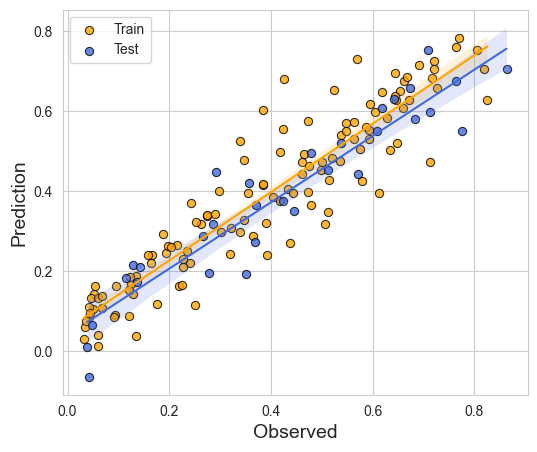

In [98]:
n = len(y_pred_train)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(train_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_train.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'trainThe value of bic_test is: {bic_value}')

n = len(y_pred_test)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(test_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_test.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'testThe value of bic_test is: {bic_value}')
ax = regplot(y_train, y_pred_train, line_color='orange',
             marker_color='orange', marker_size=35, fill_color='orange',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Train")
_ = regplot(y_test, y_pred_test, line_color='royalblue', ax=ax,
                marker_color='royalblue', marker_size=35, fill_color='royalblue',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Test", ax_kws=dict(legend_kws=dict(loc=(0.1, 0.8))))
plt.show()

### lightgbm

In [99]:
import lightgbm as lgb

In [32]:
!pip install lightgbm

   ---------------------------------------- 0.0/1.3 MB ? eta -:--:--
   ---- ----------------------------------- 0.2/1.3 MB 3.1 MB/s eta 0:00:01
   --------------- ------------------------ 0.5/1.3 MB 5.6 MB/s eta 0:00:01
   ---------------------------------------  1.3/1.3 MB 10.6 MB/s eta 0:00:01
   ---------------------------------------- 1.3/1.3 MB 8.5 MB/s eta 0:00:00


In [100]:
lgb_train = lgb.Dataset(X_train_scaled, y_train)

# Define your parameter grid
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'num_leaves': [31, 50, 100],
    'feature_fraction': [0.6, 0.7, 0.8],
    'bagging_fraction': [0.6, 0.7, 0.8],
    'bagging_freq': [5, 7, 10]
}

# Create a LightGBM regressor
gbm = lgb.LGBMRegressor(boosting_type='dart', objective='regression', metric='l2', verbose=0)

# Grid search
grid_search = GridSearchCV(gbm, param_grid, cv=3)
grid_search.fit(X_train_scaled, y_train)
# Best model
best_model_lgb = grid_search.best_estimator_

# Predictions on test and train data
y_pred_test = best_model_lgb.predict(X_test_scaled)
y_pred_train = best_model_lgb.predict(X_train_scaled)

# Evaluate the model on test data
n_test = len(y_test)
p_test = X_test_scaled.shape[1]
test_mse = mean_squared_error(y_test, y_pred_test)
test_r2 = r2_score(y_test, y_pred_test)
test_adjusted_r_squared = 1 - (1 - test_r2) * (n_test - 1) / (n_test - p_test - 1)

# Evaluate the model on train data
n_train = X_train_scaled.shape[0]
p_train = X_train_scaled.shape[1]
train_mse = mean_squared_error(y_train, y_pred_train)
train_r2 = r2_score(y_train, y_pred_train)
train_adjusted_r_squared = 1 - (1 - train_r2) * (n_train - 1) / (n_train - p_train - 1)

# Print results
print(f'Best model parameters: {grid_search.best_params_}')
print(f'MSE_test: {test_mse}, R2_test: {test_r2}, Adjust_R2_test: {test_adjusted_r_squared}')
print(f'MSE_train: {train_mse}, R2_train: {train_r2}, Adjust_R2_train: {train_adjusted_r_squared}')


[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[L

trainThe value of bic_test is: -234.78761244614722
testThe value of bic_test is: -43.21398207661019


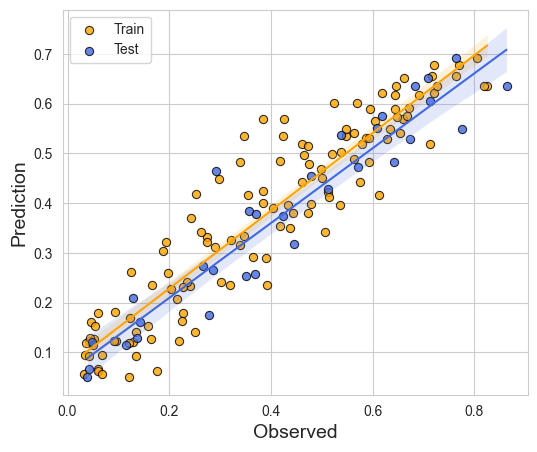

In [101]:
n = len(y_pred_train)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(train_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_train.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'trainThe value of bic_test is: {bic_value}')

n = len(y_pred_test)
def calculate_log_likelihood_from_mse(mse, n):
    llf = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(mse) - 0.5 * n
    return llf
log_likelihood = calculate_log_likelihood_from_mse(test_mse, n)
llf = log_likelihood
nobs = n
df_modelwc = len(X_test.columns)
bic_value = em.bic(llf, nobs, df_modelwc)
print(f'testThe value of bic_test is: {bic_value}')
ax = regplot(y_train, y_pred_train, line_color='orange',
             marker_color='orange', marker_size=35, fill_color='orange',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Train")
_ = regplot(y_test, y_pred_test, line_color='royalblue', ax=ax,
                marker_color='royalblue', marker_size=35, fill_color='royalblue',
             scatter_kws={'edgecolors':'black', 'linewidth':0.8, 'alpha': 0.8},
             show=False, label="Test", ax_kws=dict(legend_kws=dict(loc=(0.1, 0.8))))
plt.show()

Mean absolute error for SVR: 0.016349119899123278
Mean absolute error for GradientBoostingRegressor: 0.022044889233980146
Mean absolute error for KNeighborsRegressor: 0.058692513326151496
Mean absolute error for MLPRegressor: 0.023906683959696803
Mean absolute error for AdaBoostRegressor: 0.05013885669943942
Mean absolute error for ExtraTreesRegressor: 0.048167132525050456
Mean absolute error for XGBRegressor: 0.03005414796244713
Mean absolute error for RandomForestRegressor: 0.04310950327692174


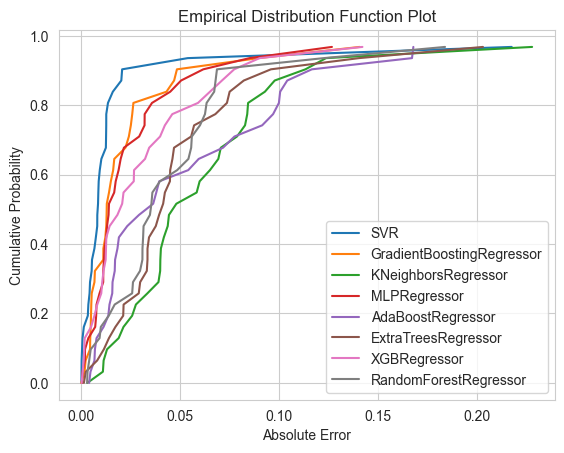

In [102]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error

# Assuming you have your test data `X_test` and true target values `y_test`
# X_test = ... # Your test features
# y_test = ... # True target values

# print(np.abs())

# List of your models
models = [best_model_svr, best_model_GBR, best_model_KN, best_model_MLP, best_model_ABR, best_model_ETR, best_model_XGB, best_model_RF]

# Calculate individual absolute errors for each model
absolute_errors = []
for model in models:
    y_pred = model.predict(X_test_scaled)
    
    errors = np.abs(y_test-y_pred)  # This will give us an array of errors
    absolute_errors.append(errors)
    # print(np.mean(errors))
    # Print the mean absolute error for the current model
    print(f'Mean absolute error for {model.__class__.__name__}: {mean_absolute_error(y_test, y_pred)}')

# Now, plot the ECDF for each set of errors
for errors, model in zip(absolute_errors, models):
    # Sort the individual absolute error data
    sorted_data = np.sort(errors)
    # Calculate the cumulative probability
    yvals = np.arange(len(sorted_data)) / float(len(sorted_data))
    plt.plot(sorted_data, yvals, label=model.__class__.__name__)

plt.xlabel('Absolute Error')
plt.ylabel('Cumulative Probability')
plt.title('Empirical Distribution Function Plot')
plt.legend(loc='best')
plt.grid(True)
plt.show()


In [72]:
absolute_errors = []
for model in models:
    y_pred = model.predict(X_train_scaled)
    
    errors = np.abs(y_train-y_pred)  # This will give us an array of errors
    absolute_errors.append(errors)
    # print(np.mean(errors))
    # Print the mean absolute error for the current model
    print(f'Mean absolute error for {model.__class__.__name__}: {mean_absolute_error(y_train, y_pred)}')

Mean absolute error for SVR: 0.01789467250186077
Mean absolute error for GradientBoostingRegressor: 0.022100208117554438
Mean absolute error for KNeighborsRegressor: 0.010908196721311474
Mean absolute error for MLPRegressor: 0.026406871104201163
Mean absolute error for AdaBoostRegressor: 0.050606220166345105
Mean absolute error for ExtraTreesRegressor: 0.029843698904123757
Mean absolute error for XGBRegressor: 0.023148099484132312
Mean absolute error for RandomForestRegressor: 0.03171726303792388
